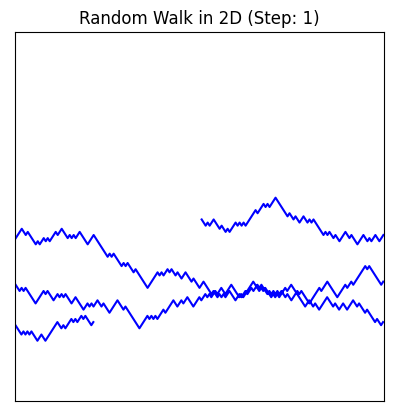

In [1]:
"""
Random Walk Animation Using Quantum Circuit
Author: Bolzmann
Project: Qugel

This script generates a 2D random walk animation using a quantum circuit. It simulates the diffusion of particles in a square grid. Each step of the random walk is determined by a random angle generated from a quantum circuit.

The animation shows the movement of particles as they take steps in random directions. The size of the square grid, the number of steps, and the starting location of particles can be configured.

The quantum circuit uses the PennyLane library to generate random angles between 0 and 360 degrees. It applies a Hadamard gate and a controlled-NOT gate to produce random numbers.

The animation is created using Matplotlib's FuncAnimation, which updates the plot for each step of the random walk. The x and y coordinates of the particles are stored in lists, and the plot is cleared and redrawn at each step.

To run the script, simply execute the code. The animation will be displayed in the Jupyter Notebook.

Note: This script requires the following libraries to be installed: numpy, matplotlib, pennylane.
"""

from random import randrange as rand
from numpy import cos, sin, radians
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import pennylane as qml
from IPython.display import HTML

N = 100   # Size of square as a multiple of the step size.
NSteps = 500   # Number of steps in simulation.
xStart = 0   # x coordinate of starting location. Origin is at the center of the square.
yStart = 0   # y coordinate of starting location. Origin is at the center of the square.

s = 1   # Step number.
x = xStart   # x coordinate of point.
y = yStart   # y coordinate of point.
xList = []   # List of the x coordinates of all points visited.
yList = []   # List of the y coordinates of all points visited.

# Quantum circuit and device setup
wires = 2
dev = qml.device("default.qubit", wires=wires, shots=1)

@qml.qnode(dev)
def random_walk_circuit():
    """
    Quantum circuit for generating a random number between 0 and 360 degrees.

    Returns:
        float: Random angle in degrees.
    """
    qml.Hadamard(wires=0)
    qml.CNOT(wires=[0, 1])

    exp_vals = [qml.expval(qml.PauliZ(i)) for i in range(wires)]
    
    return exp_vals * 360

def wrap(v, N):
    if v > N/2:
        return v - N, True
    elif v < -N/2:
        return v + N, True
    return v, False

fig, ax = plt.subplots()

def update(frame):
    global x, y, xList, yList

    angle = (float(random_walk_circuit()[0]))
    
    x, wrap_flag_x = wrap(x + cos(angle), N)
    y, wrap_flag_y = wrap(y + sin(angle), N)
    if wrap_flag_x or wrap_flag_y:
        xList.append(np.nan)
        yList.append(np.nan)
    xList.append(x)
    yList.append(y)

    ax.cla()
    ax.plot(xList, yList, c="b")
    ax.set_xlim(-N/2, N/2)
    ax.set_ylim(-N/2, N/2)
    ax.set_aspect('equal', adjustable='box')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_title(f"Random Walk in 2D (Step: {frame+1})")

ani = FuncAnimation(fig, update, frames=NSteps, interval=200)

# Display the animation in Jupyter Notebook using HTML
HTML(ani.to_jshtml())
